## Load Modules

In [1]:
from xmitgcm import open_mdsdataset
import xarray as xr
import numpy as np
import xgcm
import datetime
import os
from matplotlib import pyplot as plt 
from scipy import interpolate
import cartopy
import warnings; warnings.simplefilter('ignore')
from numba import jit

from parcels import FieldSet, ParticleSet, Variable, JITParticle, AdvectionRK4, plotTrajectoriesFile, AdvectionRK4_3D, ErrorCode
import math
from datetime import timedelta
from operator import attrgetter


%matplotlib inline
plt.rcParams['figure.figsize'] = (15,10)

plt.rcParams['font.size'] = 16
plt.rcParams['text.usetex'] = False



plot_dir = '/glade/u/home/myoungs/Figures/'+datetime.date.today().isoformat()+'/'
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)

from dask.distributed import Client
client = Client()
client

Client Scheduler: tcp://127.0.0.1:36685 Dashboard: http://127.0.0.1:42635/status,Cluster Workers: 9 Cores: 72 Memory: 134.72 GB


## Create a xarray dataset from MITgcm

In [2]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (15,10)
plt.rcParams['font.size'] = 16
plt.rcParams['text.usetex'] = False

#run = 'layers0.15'


plot_dir = '/glade/u/home/myoungs/Figures/'+datetime.date.today().isoformat()+'/'
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)

#for x in run:
    ## read in data #######
      
#data_dir_m = '/glade/scratch/myoungs/'+run_m
data_dir = '/glade/p/univ/umit0025/newcarbon/dop_15'

print(data_dir)
    
iters1=[72059904,72007200]

iters2 = range(72112464,72164880,144)
#dsmean = open_mdsdataset(data_dir,prefix=['DIAG','DIAGLayer','DIAGSurf'],delta_t=600,iters = iters1)
ds = open_mdsdataset(data_dir,prefix=['DIAG','DIAGTracer','DIAGSurf'],delta_t=600,iters=iters2)


#ds =  open_mdsdataset(data_dir,prefix=['DIAGLayer','DIAG'],delta_t=600)
#                        # ignore_unknown_vars==True)#,iters='377225') # ,'DIAGTracer'
grid = xgcm.Grid(ds, periodic=['X'])
#gridmean = xgcm.Grid(dsmean, periodic=['X'])
ds

/glade/p/univ/umit0025/newcarbon/dop_15


OSError: Could not find the expected file prefixes ['DIAG', 'DIAGTracer', 'DIAGSurf'] at iternum 7.21125e+07. (Instead found [])

In [6]:
EKE = 1/2*(grid.interp(ds.VVELSQ[:,0].mean(dim='time') - ds.VVEL[:,0].mean(dim='time')*ds.VVEL[:,0].mean(dim='time'),'X') + grid.interp(ds.UVELSQ[:,0].mean(dim='time') - ds.UVEL[:,0].mean(dim='time')*ds.UVEL[:,0].mean(dim='time'),'Y',boundary='extend'))
ds5 = xr.Dataset({
        "DIC": (("Z", "YC","XC"), ds.TRAC01.mean(dim='time')),
         "DICCFLX": (("YC","XC"), ds.DICCFLX.mean(dim='time')),
         "EKE": (("YC","XC"), EKE)},
    coords={"Z":ds.Z, "YC": ds.YC,"XC":ds.XC})

ds5.to_netcdf('/glade/p/univ/umit0025/newcarbon/dop_15/dicave.nc')

## Create smaller dataset

In [6]:
@jit
def WusingCont(U,V,dF,dx,dy,xgrid):
    dudx = grid.interp(grid.diff(U,'X'),'X')/dx
    dvdy = grid.interp(grid.diff(V,'Y',boundary='extend'),'Y',boundary='extend')/dy
    w = grid.interp(grid.cumsum((dudx + dvdy)*dF,'Z',boundary='extend'),'Z',boundary = 'extend')
    return w

@jit
def co3eq(temp, s, z, alk, dic):
    """
    Calculates pCO2, pH, H2CO3*, HCO3, and CO3 concentrations.

    NOTE: Currently you have to do this for a single point at a time. Due to
    dependence on `np.roots`, it isn't extremely easy to vectorize, although
    I imagine it is possible if one spent a little time on it.

    Contact: Riley.Brady@colorado.edu


    Parameters
    ----------
    temp : float
        Temperature at location (degC)
    s : float
        Salinity at location (ppt)
    z : float
        Depth at location (m)
    alk : float
        Alkalinity at location (umol/kg)
    dic : float
        DIC at location (umol/kg)


    Returns
    -------
    pCO2 (uatm), pH, CO2 (umol/kg), HCO3 (umol/kg), CO3 (umol/kg) as floats.


    Reference
    ---------
    Emerson and Hedges 2008: Chemical Oceanography and the Marine Carbon Cycle.
    (4A 1.2)


    Example
    -------
    pco2, pH, CO2, HCO3, CO3 = co3eq(15, 35, 10, 2300, 2100)
    """
    # Conversions
    t = temp + 273.15
    Pr = z/10
    alk = alk * 1e-6
    dic = dic * 1e-6
    R = 83.131

    # Calculate total borate from chlorinity
    tbor = .000416 * s / 35

    # Calculate Henry's Law coefficient, K0 (Weiss, 1974)
    U1 = -60.2409 + 93.4517 * (100/t) + 23.3585*np.log(t/100)
    U2 = s * (.023517 - .023656 * (t/100) + .0047036 * (t/100)**2)
    KH = np.exp(U1 + U2)

    # Calculate KB from temp and salinity (Dickson, 1990)
    KB = np.exp((-8966.9 - 2890.53 * s**0.5 - 77.942 * s + 1.728 * s**1.5
                 - 0.0996 * s**2)/t + 148.0248 + 137.1942 * s**0.5 + 1.62142 * s
                 - (24.4344 + 25.085 * s**0.5 + 0.2474 * s) * np.log(t)
                 + 0.053105 * s**0.5 * t);

    # Calculate K1 and K2 (Luecker et al., 2000)
    K1 = 10**(-(3633.86/t - 61.2172 + 9.67770 * np.log(t) - 0.011555 * s
                + 0.0001152 * s**2))
    K2 = 10**(-(471.78/t + 25.92990 - 3.16967 * np.log(t) - 0.01781 * s
                + 0.0001122 * s**2))

    # Pressure variation of K1, K2, and KB (Millero, 1995)
    dvB = -29.48 + 0.1622 * temp - .002608 * (temp)**2
    dv1 = -25.50 + 0.1271 * temp
    dv2 = -15.82 - 0.0219 * temp
    dkB = -.00284
    dk1 = -.00308 + 0.0000877 * temp
    dk2 = .00113 - .0001475 * temp
    KB  = (np.exp(-(dvB / (R * t)) * Pr + (0.5 * dkB / (R * t)) * Pr**2)) * KB
    K1  = (np.exp(-(dv1 / (R * t)) * Pr + (0.5 * dk1 / (R * t)) * Pr**2)) * K1
    K2  = (np.exp(-(dv2 / (R * t)) * Pr + (0.5 * dk2 / (R * t)) * Pr**2)) * K2

    # Temperature dependence of KW (DOE, 1994)
    KW1 = 148.96502 - 13847.26 / t - 23.65218 * np.log(t)
    KW2 = (118.67 / t - 5.977 + 1.0495 * np.log(t)) * s**.5 - 0.01615 * s
    KW  = np.exp(KW1 + KW2)

    # solve for H ion (Zeebe and Wolf-Gladrow, 2000)
    a1 = 1
    a2 = (alk + KB + K1)
    a3 = (alk * KB - KB * tbor - KW + alk * K1 + K1 * KB + K1 * K2 - dic * K1)
    a4 = (-KW  * KB + alk * KB * K1 - KB * tbor * K1 - KW * K1 + alk * K1 * K2
          + KB * K1 * K2 - dic * KB * K1 - 2 * dic * K1 * K2)
    a5 = (-KW * KB * K1 + alk * KB * K1 * K2 - KW * K1 * K2 - KB * tbor * K1
          * K2 - 2 * dic * KB * K1 * K2)
    a6 = -KB * KW * K1 * K2
    p = [a1, a2, a3, a4, a5, a6]
    r = np.roots(p)
    h = np.max(np.real(r))

    # Calculate bicarbonate, carbonate, and aqueous CO2 usin DIC, Alk, and H+
    hco3 = dic / (1 + h/K1 + K2/h) * 1e6
    co3 = dic / (1 + h/K2 + h * h / (K1 * K2)) * 1e6
    co2 = dic / (1 + K1/h + K1 * K2 / (h * h)) * 1e6
    pco2 = co2 / KH
    pH = -np.log10(h)

    # Calculate B(OH)4 and OH
    BOH4 = KB * tbor / (h + KB)
    OH = KW / h

    # recalculate DIC and Alk to check calculations
    Ct = (hco3 + co3 + co2) * 1e6
    At = (hco3 + 2*co3 + BOH4 + OH - h) * 1e6

    return pco2, pH, co2, hco3, co3

# split into mean geostrophic, eddy geostrophic, mean baroclinic, mean barotropic, eddy baroclinic, eddy barotropic
#wmean = (grid.interp(ds.WVEL*0 + dsmean.WVEL.mean(dim='time'),'Z',boundary='extend'))
#vmean = (grid.interp(ds.VVEL*0 + dsmean.VVEL.mean(dim=['time']),'Y',boundary='extend'))

# calculate geostrophic velocities
#vgeo = ((grid.interp(grid.diff(ds.PHIHYD,'X'),'X')/ds.dxG[0,0])/(-1e-4+1e-11*ds.YC))
#ugeo = (-1*(grid.interp(grid.diff(ds.PHIHYD,'Y',boundary='extend'),'Y',boundary='extend')/ds.dyG[0,0])/(-1e-4+1e-11*ds.YC))
#wgeo = (WusingCont(ugeo,vgeo, ds.drF, ds.dxG[0,0], ds.dyC[0,0], grid))



# calculate mean geostrophic
#mvgeo = vgeo*0 + ((grid.interp(grid.diff(ds.PHIHYD,'X'),'X')/ds.dxG[0,0])/(-1e-4+1e-11*ds.YC))
#mugeo = ugeo*0 + ugeo.mean(dim='time')
#mwgeo = (WusingCont(mugeo,mvgeo, ds.drF, ds.dxG[0,0], ds.dyC[0,0], grid))

# calculate barotropic velocities
#ubt = wmean*0 + grid.interp((ds.UVEL*ds.drF).sum(dim='Z')/4000,'X')
#vbt = wmean*0 + grid.interp((ds.VVEL*ds.drF).sum(dim='Z')/4000,'Y',boundary='extend')
#wbt = (WusingCont(ubt,vbt, ds.drF, ds.dxG[0,0], ds.dyC[0,0], grid))


# calculate mean barotropic velocities
#ubtm = ubt*0 + grid.interp((dsmean.UVEL.mean(dim='time')*ds.drF).sum(dim='Z')/4000,'X')
#vbtm = vbt*0 +  grid.interp((dsmean.VVEL.mean(dim='time')*ds.drF).sum(dim='Z')/4000,'Y',boundary='extend')
#wbtm = WusingCont(ubtm, vbtm, ds.drF, ds.dxG[0,0], ds.dyC[0,0], grid)

#plt.figure()
#wmean[0,4].plot()

#plt.figure()
#vmean[0,4].plot()

#plt.figure()
#ds.UVEL[:,4].mean(dim='time').plot()

## Save smaller dataset to Netcdf file

In [ ]:
ds4 = xr.Dataset({"UVEL_C":  
        (("time", "Z", "YC","XC"),grid.interp(ds.UVEL,'X')),
        "VVEL_C": (("time","Z", "YC","XC"), grid.interp(ds.VVEL,'Y',boundary='extend')),
        "WVEL_C": (("time","Z", "YC","XC"), grid.interp(ds.WVEL,'Z',boundary='extend')),
        "THETA": (("time","Z", "YC","XC"), ds.THETA),
        "DIC": (("time","Z", "YC","XC"), ds.TRAC01),
        "ALK": (("time","Z", "YC","XC"), ds.TRAC02),
        "DICFLX": (("time","Z", "YC","XC"), ds.DICCFLX)},
    coords={"time":ds.time, "Z": ds.Z, "YC": ds.YC,"XC":ds.XC})

ds4.to_netcdf('/glade/p/univ/umit0025/newcarbon/dop_15/testdata.nc')

In [7]:
ds4 = xr.Dataset({"UVEL_C":  
        (("time", "YC","XC"),grid.interp(ds.UVEL[:,19],'X')),
        "VVEL_C": (("time", "YC","XC"), grid.interp(ds.VVEL[:,19],'Y',boundary='extend')),
        "THETA": (("time", "YC","XC"), ds.THETA[:,0]),
        "DIC": (("time", "YC","XC"), ds.TRAC01[:,0]),
        "ALK": (("time", "YC","XC"), ds.TRAC02[:,0]),
        "DICFLX": (("time", "YC","XC"), ds.DICCFLX),
        "pH":(("time", "YC","XC"), ds.DICPHAV)},
    coords={"time":ds.time, "YC": ds.YC,"XC":ds.XC})

ds4.to_netcdf('/glade/p/univ/umit0025/newcarbon/dop_15/testdataArgo.nc')

In [55]:
ds4 = xr.Dataset({
        "DICFLX": (("YC","XC"), ds.DICCFLX.mean(dim='time'))},
    coords={"YC": ds.YC,"XC":ds.XC})

ds4.to_netcdf('/glade/p/univ/umit0025/newcarbon/dop_15/testDICFlux.nc')

## Set up particle tracker with carbon

Want to track all 4 the carbon variables

Track what happens after particles get to the surface

Track particles as they reenter the domain to get robust statistics

In [2]:
#variables = {'U': 'UVEL_C', 'V': 'VVEL_C','W':'WVEL_C','T':'THETA','DIC':'DIC',
#             'ALK':'ALK'}
#dimensions = {'time': 'time', 'depth': 'Z','lat': 'YC', 'lon': 'XC' }

variables = {'U': 'UVEL_C', 'V': 'VVEL_C','T':'THETA','DIC':'DIC',
             'ALK':'ALK','DICFLX':'DICFLX','pH':'pH'}
dimensions = {'time': 'time','lat': 'YC', 'lon': 'XC' }

repeatdt = timedelta(days=364) 
fieldset = FieldSet.from_netcdf('/glade/p/univ/umit0025/newcarbon/dop_15/testdataArgo.nc',variables, dimensions,mesh='flat',
                                time_periodic=repeatdt,field_chunksize='auto')#{'time': 20, 'lat': 204, 'lon': 400})
fieldset.add_constant('halo_west', fieldset.U.grid.lon[0])
fieldset.add_constant('halo_east', fieldset.U.grid.lon[-1])
fieldset.add_periodic_halo(zonal=True)

        
class SampleParticle(JITParticle):         # Define a new particle class
    t = Variable('t', initial=0.) 
    dic = Variable('dic', initial=0.) 
    alk = Variable('alk', initial=0.)
    dicflux = Variable('dicflux',initial=0.)# Variable 't' initialised by sampling the temperature
    ph = Variable('ph',initial=0.)
    xdisp = Variable('xdisp', initial=0., to_write=False)
    ydisp = Variable('ydisp', initial=0., to_write=False)
    vtot = Variable('vtot',initial=0., to_write=False)
    utot = Variable('utot',initial=0., to_write=False)
    
    #vmean = Variable('vmean', initial=0., to_write=False)
    #vtot = Variable('vtot',initial=0., to_write=False)
    #vbt = Variable('vbt', initial=0., to_write=False)
    #vbtm = Variable('vbtm', initial=0., to_write=False)
    #meandisp = Variable('meandisp', initial=0., dtype=np.float32)
    #totdisp = Variable('totdisp', initial=0., dtype=np.float32)
    #btdisp = Variable('btdisp', initial=0., dtype=np.float32)
    #meanbtdisp = Variable('meanbtdisp', initial=0., dtype=np.float32)
    
    
 #       wmean = Variable('wmean', initial=fieldset.WMEAN, to_write=False)
 #   wtot = Variable('wtot',initial=fieldset.W, to_write=False)
 #   wgeo = Variable('wgeo', initial=fieldset.WGEO, to_write=False)
 #   wgeom = Variable('wgeom', initial=fieldset.WGEO_M, to_write=False)
 #   wbt = Variable('wbt', initial=fieldset.WBT, to_write=False)
 #   wbtm = Variable('wbtm', initial=fieldset.WBT_M, to_write=False)
    
    
    
    
def periodicBC(particle, fieldset, time):
    if particle.lon < fieldset.halo_west:
        particle.lon += fieldset.halo_east - fieldset.halo_west
    elif particle.lon > fieldset.halo_east:
        particle.lon -= fieldset.halo_east - fieldset.halo_west
        
        
def SampleP(particle, fieldset, time):  # Custom function that samples fieldset.P at particle location
    particle.t = fieldset.T[time, particle.depth, particle.lat, particle.lon]
    particle.dic = fieldset.DIC[time, particle.depth,particle.lat, particle.lon]
    particle.alk = fieldset.ALK[time, particle.depth, particle.lat, particle.lon]
    particle.dicflux = fieldset.DICFLX[time, particle.depth, particle.lat, particle.lon]
    particle.ph = fieldset.pH[time, particle.depth, particle.lat, particle.lon]
    particle.vtot = fieldset.V[time, particle.depth, particle.lat, particle.lon]
    particle.utot = fieldset.U[time, particle.depth, particle.lat, particle.lon]
    #particle.t = fieldset.T[time, particle.depth, particle.lat, particle.lon]
    #particle.dic = fieldset.DIC[time, particle.depth, particle.lat, particle.lon]
    #particle.alk = fieldset.ALK[time, particle.depth, particle.lat, particle.lon]
    #particle.vmean = fieldset.VMEAN[time, particle.depth, particle.lat, particle.lon]
    #particle.vtot = fieldset.V[time, particle.depth, particle.lat, particle.lon]
    #particle.vbt = fieldset.VBT[time, particle.depth, particle.lat, particle.lon]
    #particle.vbtm = fieldset.VBT_M[time, particle.depth, particle.lat, particle.lon]
    

def DeleteParticle(particle, fieldset, time):
    particle.delete()
    
def NBMLDelete(particle, fieldset, time):
    #if particle.depth >= -300:
    #    particle.delete()
    if particle.xdisp > 2.5e5 or particle.xdisp < -2.5e5:
        particle.delete()
    if particle.ydisp > 2.5e5 or particle.ydisp < -2.5e5:
        particle.delete()

def MeanUpwelling(particle, fieldset, time):  
    particle.xdisp += particle.utot*particle.dt
    particle.ydisp += particle.vtot*particle.dt

#def MeanUpwelling(particle, fieldset, time):  
#    particle.meandisp += particle.vmean*particle.dt
#    particle.totdisp += particle.vtot*particle.dt
#    particle.btdisp += particle.vbt*particle.dt
#    particle.meanbtdisp += particle.vbtm*particle.dt


## Generate field of particles
Run particles in temperature layers as I did before to test how well particles stay in temperature layers

First pick a temperature layer, 4 C

Eventually want to look at all at once

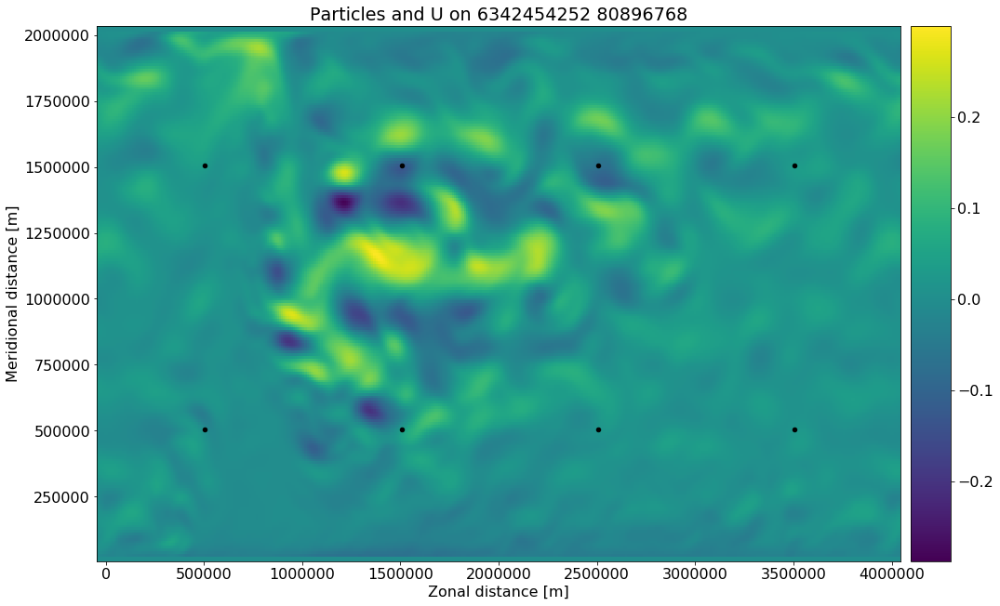

In [12]:
#tempmin = 2
#tempmax = 2.2

#out = ds.THETA[0,:,:,10].where(ds.THETA[0,:,:,10]<=tempmax).where(ds.THETA[0,:,:,10]>tempmin).where(ds.Z<-300).where(ds.YC<1.95e6)
#zout = (out*0+1)*ds.Z
#yout = (out*0+1)*ds.YC
#zs = np.reshape(np.array(zout),6528)
#zs1 = zs[np.logical_not(np.isnan(zs))]
#ys = np.reshape(np.array(yout),6528)
#ys1 = ys[np.logical_not(np.isnan(ys))]
#xs = np.reshape(np.array((out*0+1)*1.05e5),6528)
#xs1 = xs[np.logical_not(np.isnan(xs))]
#times = np.reshape(np.array((out*0+1)*ds.time[0]),6528)
#times1 = times[np.logical_not(np.isnan(times))]


xgrid, ygrid = np.meshgrid(np.array(ds.XC[range(50,400,100)]), np.array(ds.YC[range(50,200,100)]))
xs1 = np.reshape(xgrid,8)
ys1 = np.reshape(ygrid,8)

#repeatdt = timedelta(days=30) 
pset = ParticleSet.from_list(fieldset=fieldset, pclass=SampleParticle, lon=xs1, lat=ys1, time=0)
pset.show(field=fieldset.U)

## Run particle advection

INFO: Compiled SampleParticleAdvectionRK4periodicBCSamplePMeanUpwelling ==> /var/tmp/pbs.8525025.chadmin1.ib0.cheyenne.ucar.edu/parcels-20804/66c7fbc41319b427635f9ddb5e3868ef_0.so
INFO: Temporary output files are stored in /glade/p/univ/umit0025/newcarbon/dop_15/out-OIDZNTMA.
INFO: You can use "parcels_convert_npydir_to_netcdf /glade/p/univ/umit0025/newcarbon/dop_15/out-OIDZNTMA" to convert these to a NetCDF file during the run.
 13% (4233600.0 of 31536000.0) |#        | Elapsed Time: 0:00:49 ETA:   0:06:48distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
 14% (4492800.0 of 31536000.0) |#        | Elapsed Time: 0:00:53 ETA:   0:05:41distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
 14% (4665600.0 of 31536000.0) |#        | Elapsed Time: 0:00:55 ETA:   0:06:47distributed.utils_perf - WARNING - full garbage collections took 16% CPU time recently (threshold: 10%)
 15% (4924800.0 of

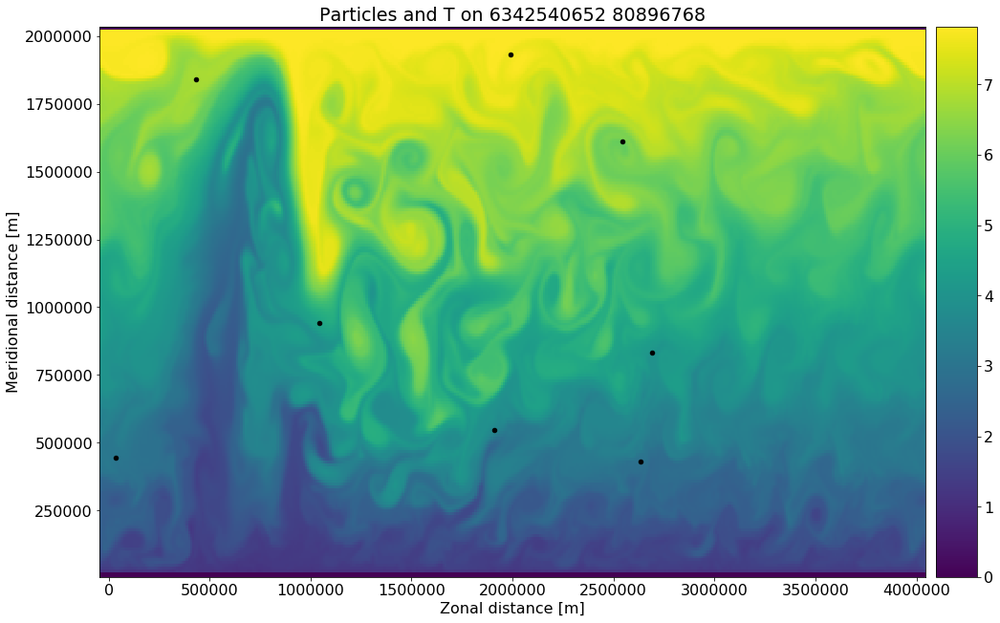

Temp values after execution: [4.5209117, 4.0383883, 2.8950472, 3.0871096, 3.6159966, 6.0309577, 7.6163635, 6.7834315]


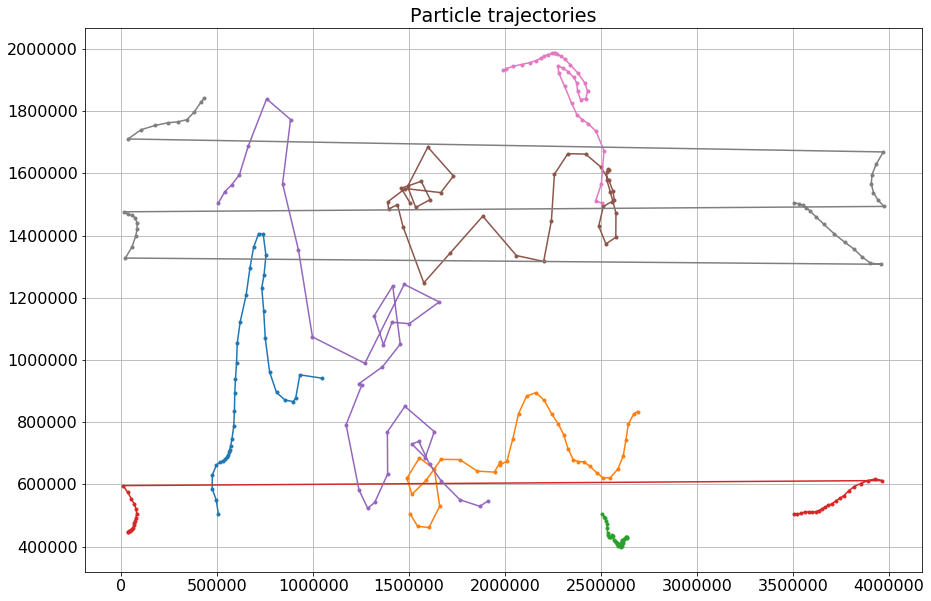

In [13]:
output_file = pset.ParticleFile(name="/glade/p/univ/umit0025/newcarbon/dop_15/ArgoCoarse.nc", outputdt=timedelta(hours=240)) # the file name and the time step of the outputs

# pset.execute(AdvectionRK4 + pset.Kernel(periodicBC), # add kernel for periodicity

pset.execute(AdvectionRK4  +  pset.Kernel(periodicBC)+ pset.Kernel(SampleP)  + pset.Kernel(MeanUpwelling),# +  +,# the kernel (which defines how particles move)
             runtime=timedelta(days=365),    # 1800 the total length of the run
             dt=timedelta(minutes=60),      # the timestep of the kernel
             output_file=output_file,
             recovery={ErrorCode.ErrorOutOfBounds: DeleteParticle})

#pset.repeatdt = None
#pset.execute(AdvectionRK4_3D  + pset.Kernel(SampleP) + pset.Kernel(NBMLDelete) + pset.Kernel(MeanUpwelling),# the kernel (which defines how particles move)
#             runtime=timedelta(days=1790),    # 1800 the total length of the run
#             dt=timedelta(minutes=60),      # the timestep of the kernel
#             output_file=output_file,
#             recovery={ErrorCode.ErrorOutOfBounds: DeleteParticle})


#print(pset)
#pset.show(field=fieldset.U)

pset.show(field=fieldset.T)#, show_time=0)
print('Temp values after execution:', [t.t for t in pset])

output_file.export()
output_file.close()
plotTrajectoriesFile('/glade/p/univ/umit0025/newcarbon/dop_15/ArgoCoarse.nc',mode='2d');

In [3]:
dst = xr.open_dataset('/glade/p/univ/umit0025/newcarbon/dop_15/ArgoCoarse800.nc',decode_times=False)
dst



<xarray.Dataset>
Dimensions:     (obs: 38, traj: 800)
Dimensions without coordinates: obs, traj
Data variables:
    trajectory  (traj, obs) float64 ...
    time        (traj, obs) float64 ...
    lat         (traj, obs) float32 ...
    lon         (traj, obs) float32 ...
    z           (traj, obs) float32 ...
    t           (traj, obs) float32 ...
    dic         (traj, obs) float32 ...
    alk         (traj, obs) float32 ...
    dicflux     (traj, obs) float32 ...
    ph          (traj, obs) float32 ...
Attributes:
    feature_type:           trajectory
    Conventions:            CF-1.6/CF-1.7
    ncei_template_version:  NCEI_NetCDF_Trajectory_Template_v2.0
    parcels_version:        2.2.1.dev13+g96ba1183
    parcels_mesh:           flat

In [4]:
#for tra in range(np.shape(dst.time)[0]):
#    if ~np.isnan(dst.lon[tra,-1]):
#            dst.lon[tra] = np.nan
#            dst.lat[tra] = np.nan
#            dst.t[tra] = np.nan
#            dst.time[tra] = np.nan


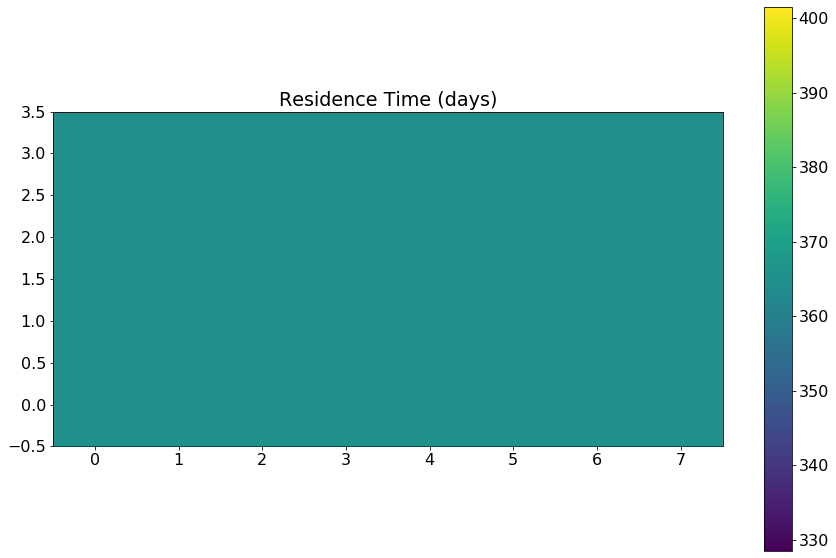

In [5]:
disps = np.array(dst.lon.where(dst.time == dst.time.max(dim='obs')))
intimes = np.array(dst.time - dst.time[:,0])
intimes = intimes[~np.isnan(disps)]

plt.imshow(intimes.reshape((4,8))/24/3600)
plt.colorbar()
plt.title('Residence Time (days)')
plt.gca().invert_yaxis()

In [4]:
@jit
def mindist(x,y,lonv,latv):
    minimum = min(np.sqrt(np.square(x-lonvec) + np.square(y-latvec)))
    return minimum

xgrid, ygrid = np.meshgrid(np.array(ds.XC), np.array(ds.YC))

# randomly sample n floats

In [5]:
indices = np.random.choice(dst.lon.shape[0],32,replace = False)

In [29]:
percentdif = np.empty(0)
for i in np.arange(1):
    indices = np.random.choice(dst.lon.shape[0],32,replace = False)

    lonvec = np.array(dst.lon[indices,1:]).flatten()
    lonvec  = lonvec[~np.isnan(lonvec)]

    latvec = np.array(dst.lat[indices,1:]).flatten()
    latvec  = latvec[~np.isnan(latvec)]

    dicfluxvec = np.array(dst.dicflux[indices,1:]).flatten()
    dicfluxvec = dicfluxvec[~np.isnan(dicfluxvec)]

    dicfluxgrid = interpolate.griddata((lonvec,latvec),dicfluxvec,(xgrid,ygrid),method='linear')

    ArgoGrid = xr.Dataset({
        "DICFLX": (("YC","XC"), dicfluxgrid),
        },
    coords={"YC": ds.YC,"XC":ds.XC})

    difcalc = (np.array(((3600*24*360*(ds.DICCFLX[:,2:202].mean(dim='time')-ArgoGrid.DICFLX))*ds.rA[2:202]).sum(dim='XC').sum(dim='YC')))
    baseline = (np.array(((3600*24*360*(ds.DICCFLX[:,2:202].mean(dim='time')-0*ArgoGrid.DICFLX))*ds.rA[2:202]).sum(dim='XC').sum(dim='YC')))
    percentdif = np.append(percentdif,difcalc/baseline)

In [23]:
percentdif32 =  [-1.00548560e+00, -8.06567223e-01, -5.15715122e-01, -6.80775166e-01,
        2.50668866e+00,  2.65976935e+00,  3.23000932e-01,  2.91028245e+00,
       -9.12935748e-01, -1.08278376e+00,  1.27863748e+00, -2.74274745e+00,
        4.34174152e-01, -6.18820544e-01, -5.54603583e-01, -4.54350619e+00,
        9.67210606e-01, -4.84186085e-02, -7.52470641e-01, -2.70405912e+00,
       -4.81750985e-01, -3.05080290e-01, -1.34888328e+00, -6.09302294e+00,
       -1.07139061e+01, -2.56408538e-01, -1.70106331e+00, -1.63340119e+00,
       -4.39747239e-01, -3.02089053e-01,  7.43338052e-01, -6.34432548e-01,
       -3.73219113e-01, -1.01444144e-02, -1.41688737e+00, -1.15208634e+00,
        4.73289904e-01,  1.29279553e+00, -1.39871617e+00, -1.08156313e+00,
       -1.38707822e+00, -1.05616296e+00,  5.35613065e+00, -8.72932103e-01,
        1.98819149e+00,  3.52519129e-01, -2.20230120e+00, -1.23821971e+00,
        1.29534954e+00, -5.74288432e-01,  3.98290061e+01, -2.16303663e-01,
       -1.23894726e+01, -3.17811461e+00,  3.10857450e-01, -5.22783280e-01,
       -4.67699105e-01,  9.94875103e-01, -2.31336683e+00, -7.43682506e-01,
        1.31554135e+00,  9.64711407e-01,  5.07066729e-01, -1.00839386e+00,
       -1.07587147e-01,  2.92683961e+00, -3.56868227e-01, -1.27147367e-01,
        6.19803201e-01,  1.91742636e-01,  3.35482119e-01, -2.39333909e-01,
        2.35394542e-01,  4.25754764e-01, -2.24106460e-01,  2.59978303e+00,
        1.78462842e+01, -1.02245571e+00, -2.71469121e+00, -2.15638553e-01,
       -6.37495265e-01, -5.64980458e-02, -6.04751120e-01, -2.31675559e+00,
        6.68927512e-01, -6.84527282e-01,  1.03622024e-01, -6.34857582e-01,
       -5.15483134e-01, -2.50415109e-01, -6.07978553e-01, -6.74218941e-01,
       -3.04283566e-02,  8.98373339e+00, -3.50886388e-01,  1.22307867e+00,
        3.27647613e-01, -4.44561936e-01, -5.87928291e-02, -1.88814183e+00,
       -7.74954688e-01, -6.47387376e-01, -6.94860800e-01, -1.20214142e+02,
       -1.83016823e-01, -1.08141487e+00, -9.34897677e-01,  3.64949481e-01,
        3.73483812e-02,  3.72039060e-01, -4.30543020e-01, -8.82356760e-01,
        5.65778428e-01, -1.20254110e-02,  6.74071648e-01, -5.53070124e-01,
       -1.63074545e+00,  7.94771923e-02,  2.76905531e+00, -7.96995294e-01,
       -1.60922230e-01, -6.34305915e-01,  7.43323224e+00,  1.69034695e+00,
       -5.84947156e-01, -6.51711252e-04,  1.12688201e-01, -1.34065489e+00,
       -3.26083047e+00, -1.16534054e+00, -1.14547360e+00, -1.23870688e-01,
       -6.00737792e-01, -9.17900213e-01, -8.48508833e+00, -1.28220910e+00,
        2.09803211e-01, -1.31992683e+00,  3.59102103e-01, -7.45255966e-01,
        1.29520414e+00, -1.52258729e+00,  2.99385593e-01, -2.84161832e+00,
       -2.88106875e-01, -6.27114459e+00,  3.89982370e+00, -5.76526608e-01,
        7.98916026e-01,  1.04506979e+00, -7.38341311e-01,  1.10868955e-01,
       -4.62759536e-01,  9.92597178e-02,  1.19737925e+00, -5.01196351e-01,
       -8.91320819e-02,  5.96551439e-02,  1.06099091e+00, -4.19791381e+00,
       -4.39634310e+00, -4.91830863e-01, -1.22446844e+00,  7.87925443e-01,
       -9.41026857e-01, -3.77304396e+00,  1.28418271e-01, -2.86569602e-01,
       -3.10344184e+00, -6.19863642e-01, -6.26682262e-02, -2.03414036e-01,
       -2.13290676e+01, -1.10401805e+00,  4.55948145e-01, -1.32619240e+00,
       -2.18608832e+00,  2.80298288e-01,  5.21162498e+00, -1.48755308e-01,
       -3.80217146e-01, -7.61759002e-01, -1.59312250e+00,  9.17401910e-02,
        1.92263581e+01, -8.15519508e-01, -1.58532976e-01,  2.64710164e-03,
       -1.03700311e-01,  2.48918021e-02,  1.84131041e+00,  4.27389923e-01,
       -8.92968142e-02, -9.89677901e-02, -8.49920139e-01,  1.48672193e+00,
       -2.89902582e+01,  5.47446095e-01,  3.75918494e-01, -4.50243553e+00,
        1.47771552e-01,  9.74025003e-02,  4.44234271e-02, -2.38716897e-01,
       -1.03825999e+00, -5.51717985e-01, -2.84207055e-01, -4.07434205e-01,
        4.54962867e+00, -3.33404168e-01, -4.43904807e-01, -3.22801043e-01,
       -1.48546246e+00, -2.34577549e-01,  4.02268732e-02, -2.58694316e-01,
       -2.97778262e+00,  6.50535189e-01, -1.11463700e+00, -1.75656103e+00,
       -1.18180227e+01, -1.51127994e-02,  4.25365268e-01, -1.49969471e+00,
       -6.80421364e-01,  1.87071105e+00,  4.30501739e-01,  2.35731051e+00,
       -1.97099986e+00, -2.46131416e-01,  2.03929427e-02, -3.03000683e+00,
        5.54645459e-01, -2.36610585e-01,  8.26858366e-01,  1.64144159e+00,
        6.78177062e-01, -1.22060321e+00,  3.47640691e-01, -2.90037852e+00,
        1.22605425e+01,  8.06432175e+00, -2.00001438e+00, -8.20007885e-01,
       -1.87702935e+00,  6.71022976e-01,  6.30722618e+00,  2.82255969e-01,
       -3.18263510e-02, -1.75167387e-01,  1.63595387e+01, -1.54120543e+00,
        6.61603869e+01, -3.51302957e-01, -3.53607281e+00,  2.62824447e+00,
        1.47402168e+00,  2.37996773e-01, -6.02430756e-01, -2.17607130e+00,
       -3.63732293e-01, -3.33204710e-01,  2.04804200e+01, -1.11137255e+00,
       -3.13894522e-02, -1.78212215e+00,  5.59725723e+00, -3.83583699e-01,
        4.12265529e+00, -3.77621005e-01, -5.28497182e+00, -1.94045512e+00,
        7.51411061e-01, -1.16650922e+00, -1.61156550e+00, -1.57579651e+00,
       -1.05445313e+00,  1.27933866e+00, -6.58827129e-01,  1.20759389e+00,
       -7.89233343e-01, -6.55332483e-01,  1.48822791e-01, -1.00099849e-01,
        1.26948531e+00, -1.14123216e+00,  2.27054896e-02, -9.54753882e-01,
        6.15206551e+00,  4.17021369e-02, -2.40575745e-01, -3.59320276e+00,
        1.51680158e+00, -8.60323840e-01, -4.53326940e-01, -4.19602169e-01,
       -2.01420915e-01,  1.55115413e+00, -4.02586054e-01,  1.41157890e-01,
       -1.71990152e-01,  3.62317322e-01,  3.96849924e-02,  4.54404157e-01,
        2.01223005e-02, -4.61887722e+00,  2.69025612e+00, -3.15295546e+00,
        2.04126168e+00, -1.00593275e+00,  4.38324810e-01, -9.53221879e-01,
        3.08698427e-01, -1.62431775e+00, -5.62951704e-01, -1.55003110e+00,
       -2.16903894e-01, -4.24393531e-01, -5.97235018e-01, -3.85332943e-01,
        9.78012836e-01,  1.76925822e-01,  1.04059271e+01, -8.23651662e-01,
       -6.49732908e-01, -3.53186783e-01,  1.14374838e-01, -9.58343003e-01,
       -6.61694273e+00, -3.11591155e-01,  2.41448180e-01,  2.18343769e+00,
       -6.36211876e-01, -1.61757018e+00, -3.67048781e-01, -4.49648649e-01,
        1.89145576e+00, -1.48744293e-01, -7.78581419e-01, -2.92541882e+00,
       -5.15834304e-01,  1.95629332e+01, -3.45640383e-01,  7.63504795e-01,
        1.63223018e-01, -4.20559729e+00, -2.57631915e+00, -2.96743691e-01,
       -1.64885302e+00, -1.06788961e+00,  7.72675402e-01,  2.12039565e-01,
        2.61821856e+00, -6.52179292e-01, -2.33416286e-01, -6.46129693e-01,
       -2.44816131e+00, -6.83010297e+00,  4.46571158e-01, -1.08236430e+00,
        6.78301010e-01, -1.00090176e+00, -3.28539119e-01, -4.75371505e-01,
        1.12908816e-01,  2.44300660e-01,  6.25162125e-01,  2.13870098e-01,
       -1.40246805e+00, -2.31026988e-01, -3.35233098e-01, -1.65547671e+00,
        4.14972898e-01, -9.92801902e-01, -1.13922133e-01,  6.64964781e-01,
        4.00788852e+00, -5.05198662e+00,  1.07948134e+00, -4.48867198e-01,
       -1.41252034e+00,  2.84794125e+01, -1.06353659e-01,  4.67042830e-01,
        3.16922771e-01,  2.06669799e+02, -1.79012367e+00, -2.73328514e+00,
        2.61900160e-01,  3.45725012e-01, -1.84036668e+00, -6.18573358e-01,
        3.78513083e+00,  3.91249073e-01, -5.38285463e-01, -1.45986959e-01,
        1.90294303e-01, -1.38274327e-02, -3.75269520e-01, -2.00981462e-01]

percentdif100 = [ 0.49496421, -0.21899202, -0.18178838,  0.00722286, -0.19760794,
        0.00832377, -0.51749357, -0.03398089, -0.26853503, -0.44700486,
       -0.21826592, -0.20922653, -0.38959994,  0.45808143,  0.01599912,
       -0.2800898 ,  0.006018  , -0.00500003, -0.1449337 , -0.22254447,
       -0.47107425, -0.03552474, -0.40356006, -0.47338387, -0.85175755,
       -0.31753844, -0.03968097, -0.10941744, -0.27187466, -0.02111585,
       -0.22652653,  0.31022191, -0.24660443, -0.13709618,  0.39747469,
       -0.25677254, -0.2518478 , -0.63498292, -0.48655501, -0.08008907,
        0.19219756, -0.50084179,  0.2127347 , -0.17768813, -0.21148321,
       -0.19866673, -0.22130562, -0.09471937, -0.01959116, -0.27176265,
       -0.06915542, -0.2431887 , -0.11268175, -0.33267958,  0.05285138,
       -0.04023841, -0.01113172, -0.07028165, -0.12974775, -0.0668804 ,
        0.22526944, -1.01946365,  0.3975933 ,  0.18264758, -0.30951031,
       -0.16076835, -0.09658029, -0.09035655,  0.01305807, -0.30752181,
       -0.19515097,  0.06121303, -0.25506756, -0.14136758, -0.31047822,
       -0.15968364,  0.1899315 , -0.64562242, -0.49327859,  0.13666462,
       -0.24035316, -0.22139875,  0.02687651, -0.18611478, -0.27833997,
        0.17365658, -0.25557162,  0.19992341, -0.06286033, -0.23383688,
       -0.51560593, -0.0084656 , -0.53493748, -0.11894229,  0.11109213,
       -0.07007793, -0.07397021, -0.42801932, -1.05142448, -0.28189695,
       -0.07904771, -0.08267277,  0.23309727, -0.38706659, -0.18114135,
       -0.33432918, -0.37856305, -0.03123964, -0.05398537, -0.46760378,
       -0.11948258,  0.04039728, -0.24315416, -0.18397635, -0.26296536,
       -0.45201381, -0.2065403 ,  0.06004256, -0.08849633, -0.04506281,
       -0.27601036,  0.28398178, -0.08946236, -0.38167074,  0.23381193,
        0.02672258, -0.26107058,  0.09212735, -0.42119276,  0.0728366 ,
       -0.10599842, -0.40123661, -0.19243914, -0.11691407, -0.03013687,
       -0.49627476, -0.01057854, -0.01178754, -0.15211649, -0.29625127,
       -0.29486428, -0.00378972, -0.23057064, -0.05117507, -0.20211923,
       -0.06112123,  0.23378332, -0.12976211, -0.35670328, -0.10381761,
       -0.23087634, -0.05524227, -0.74199009, -0.21200149, -0.1698415 ,
       -0.24668126,  0.1324166 , -0.38504613, -0.02323087, -0.0786673 ,
       -0.20351658, -0.27468146, -0.10518086,  0.00311645, -0.01325617,
       -0.32853975, -0.07757559, -0.29630013, -0.03518271, -0.34706552,
       -0.08101919, -0.4229014 , -0.56151693, -0.5681579 , -0.00782832,
        0.00875676,  0.71596377,  0.21612699, -0.02392037, -0.21970392,
        0.11108549, -0.1811879 ,  0.16486277, -0.2197475 , -0.07554626,
       -0.11021167, -0.03063989, -0.0644237 ,  0.11822838, -0.12885138,
       -0.19035273, -0.26770304,  0.00965824, -0.11142476,  0.16541114,
       -0.27445892, -0.27243382, -0.23655641,  0.06887413, -0.73620732,
       -0.40265338, -0.28889619, -0.17862963, -0.20643749, -0.5734381 ,
        0.13742818, -0.18615198, -0.30615259,  0.05027236,  0.01192515,
       -0.38742946, -0.11903297, -0.49025238, -0.0741843 ,  0.22301989,
       -0.03947426, -0.14015069, -0.20024378,  1.23093362, -0.03694134,
       -0.20749659,  0.10278278, -0.04805353, -0.35508898, -0.33745854,
       -0.07568656, -0.04951783, -0.27702873, -0.34854489, -0.02938869,
        0.17970221, -0.11049236, -0.51902495, -0.2208999 , -0.31144682,
       -0.36819467, -0.05210592,  0.08053504, -0.27302063,  0.08081507,
       -0.51337804,  0.03934326, -0.74046092, -0.39498632, -0.3974891 ,
       -0.19686587, -0.27420306, -0.15117794, -0.32605984, -0.03724467,
       -0.26760682, -0.17953752, -0.07173893, -0.15347066, -0.47999299,
       -0.16291451, -0.13565297,  0.04073488, -0.11006849, -0.11766532,
       -0.30890245, -0.33195574,  0.22752663,  0.19046228, -0.36033115,
       -0.31587796, -0.49265611, -0.11038824, -0.16588715, -0.5408138 ,
        0.44955249, -0.42481298, -0.32659787,  0.19413126,  0.06580803,
        0.25896072, -0.20095899,  0.4128202 ,  0.05765798, -0.31889461,
       -0.2906997 , -0.21779517, -0.03277288, -0.07024285, -0.25136208,
        0.0342039 , -0.21948711, -0.11292388, -0.07533093, -0.23211302,
       -0.15269356,  0.03197972, -0.21696101,  0.24564948, -0.12024162,
       -0.57260845, -0.40240425, -0.34057612, -0.00326051, -0.42021869,
       -0.04866995, -0.06270782, -0.25770772, -0.31139597, -0.22860203,
       -0.12275667, -0.16249644,  0.8977579 , -0.19039278, -0.30769947,
       -0.26329811, -0.2856123 , -0.47148663, -0.40476528, -0.46028016,
       -0.04177911, -0.14896847, -0.35700055, -0.47417248, -0.12902163,
       -0.18348829,  0.06414767, -0.27649283, -0.42094662,  0.00841334,
        1.69173   , -0.19713642,  0.01991158, -0.03328612, -0.15555551,
       -0.35491287, -0.18616319, -0.00524353, -0.1147513 , -0.13411851,
       -0.28808581, -0.04026386, -0.2051489 , -0.23384273, -0.07948381,
       -0.07868125, -0.18751869, -0.53737618, -0.05272459, -0.45709152,
       -0.24914755, -0.06928922, -0.01093319, -0.1472809 , -0.24839713,
       -0.02082888,  0.26807456,  0.041321  ,  0.06912113, -0.30097267,
       -0.56538846,  0.03282861, -0.12415477, -0.0776194 , -0.30634834,
       -0.10613243, -0.21599334,  0.20854521,  0.01627699, -0.16480197,
       -0.16151954, -0.17172134,  0.15330363, -0.42886606, -0.53993639,
       -0.17694755,  0.21138688, -0.14403005, -0.35806396,  0.05281486,
        0.00378212, -0.2112291 ,  0.07251588, -0.06145366,  0.12344158,
       -0.16975998, -0.15561792, -0.02080942, -0.28925082, -0.00806331,
       -0.42905468, -0.01248424,  0.020425  , -0.39394804, -0.27475186,
       -0.13502113, -0.13231909, -0.16795047, -0.26334153, -0.03919823,
       -0.34953737, -0.34030402,  0.1726698 ,  0.20217203, -0.44005814]

percentdif400 = [-0.12092497, -0.05691452, -0.05212925, -0.0054055 ,  0.00736061,
       -0.03536428,  0.05030733,  0.014808  ,  0.00956673, -0.07163437,
       -0.11477093, -0.02680684, -0.04965343,  0.00131074, -0.01264731,
       -0.01433889, -0.00194739, -0.07050279,  0.02123279, -0.05730951,
       -0.04702454, -0.0389505 , -0.0544241 ,  0.03741702,  0.00414818,
       -0.04811489, -0.00270866, -0.01903498,  0.05791658, -0.07488468,
        0.02141776,  0.08285735,  0.00725898, -0.04490158, -0.04354584,
       -0.0333117 , -0.05539542, -0.04534443, -0.05600941, -0.02251365,
       -0.00999901, -0.075269  , -0.02664741, -0.01908149, -0.07357634,
       -0.00951054, -0.00387658, -0.0602982 , -0.08422271, -0.0010171 ,
       -0.03100813, -0.03681973,  0.01754769, -0.13352397, -0.08384394,
       -0.03719274, -0.03794277, -0.03861181,  0.04894532,  0.00623001,
        0.04378028,  0.0728943 , -0.03854562, -0.02014456, -0.09500059,
       -0.08065221, -0.02763645, -0.10407522, -0.02297251, -0.05107184,
        0.04092276, -0.1099333 ,  0.00136823, -0.00511835, -0.12425597,
       -0.05301395, -0.02844736, -0.07263174, -0.10494841, -0.05633038,
       -0.02494812,  0.03461968, -0.1058049 ,  0.00588655, -0.00362177,
       -0.10438972, -0.11166671, -0.10167276, -0.12457589,  0.00143243,
       -0.00718048, -0.06839868, -0.02346884, -0.11092813, -0.0386708 ,
       -0.0108066 , -0.05415582, -0.05079582,  0.01120893, -0.10784746,
       -0.04874501, -0.01423479, -0.06108157, -0.02435016, -0.10181221,
       -0.05526916,  0.02696812, -0.03626794, -0.02972416,  0.00955265,
       -0.01372688, -0.03323952, -0.07094867, -0.04679202, -0.11056518,
        0.04584037, -0.08132499, -0.06306856,  0.00032653, -0.01132077,
       -0.01111347, -0.01387517, -0.0055659 , -0.07943573,  0.00881392,
       -0.12898471,  0.00988073, -0.07876299, -0.0382155 ,  0.01770544,
        0.01563956, -0.0356589 , -0.03900239, -0.0453922 , -0.04890638,
       -0.05066912,  0.03027797, -0.034437  , -0.10919665, -0.03296603,
       -0.052497  , -0.07255401, -0.01984607,  0.0092864 ,  0.00193316,
       -0.04416203, -0.02977948,  0.08075968, -0.02844584, -0.00880887,
       -0.01889993, -0.02482758, -0.04543414, -0.06228338,  0.02520152,
       -0.03453531, -0.02532851, -0.0530926 ,  0.00072696, -0.09090182,
       -0.05357484, -0.02390984, -0.11297021, -0.06869621, -0.05656308,
       -0.03060465, -0.0313111 , -0.05098592, -0.03506223,  0.03463843,
       -0.03987119,  0.00897351,  0.05298373,  0.01918886, -0.11896024,
        0.01322521, -0.01782747, -0.05268567, -0.11658181, -0.07691825,
       -0.01641761,  0.06610477, -0.10358504, -0.09845345, -0.04081163,
       -0.14370695, -0.09937182, -0.06957279, -0.14002016, -0.08072115,
       -0.07794672, -0.01190407,  0.02576593, -0.11768211,  0.01885143,
       -0.07914486,  0.01604985, -0.10448784, -0.04515464, -0.06038478,
       -0.04348297, -0.03697759, -0.06321736, -0.05630415, -0.0064489 ,
       -0.03437814,  0.01061878, -0.00916415,  0.00450014,  0.01109405,
       -0.02642003, -0.03616085, -0.1127574 , -0.0012567 , -0.06381589,
        0.00342205,  0.01894833, -0.00405063, -0.00072497, -0.11148154,
       -0.12238495, -0.01214403, -0.03646923, -0.07535251,  0.02018235,
        0.02352743,  0.00566397,  0.01267915,  0.01735908, -0.02854682,
       -0.06365256, -0.03426129,  0.02620807, -0.04539531,  0.01079524,
        0.02957424, -0.03084946, -0.10840419, -0.02858755,  0.00344767,
       -0.03632091, -0.06701989, -0.05113462, -0.06938261, -0.07672247,
       -0.03544013, -0.0121485 , -0.03696365,  0.01026185, -0.13615123,
       -0.06125497, -0.06491651, -0.0902106 , -0.09119578, -0.08877993,
        0.01187129, -0.04273653, -0.03444378, -0.11104349,  0.04042984,
       -0.02783312,  0.0014238 , -0.03141068,  0.00606808, -0.024798  ,
       -0.0579242 ,  0.00830919,  0.01604458, -0.05318105,  0.03450776,
       -0.02400493, -0.02729894, -0.02974583, -0.00646467, -0.03974521,
       -0.07068242, -0.02574169, -0.08838518,  0.05529338, -0.08350296,
       -0.04777962,  0.07078882, -0.01145418, -0.03960648, -0.11721781,
        0.06357871, -0.07078678,  0.00498752,  0.01836063,  0.02405568,
       -0.0557937 ,  0.06356686, -0.03509217, -0.04686377, -0.05247565,
       -0.01143124, -0.05424559, -0.08715039, -0.07279657,  0.02097926,
       -0.01602464, -0.11422731,  0.05035098, -0.058567  , -0.0277875 ,
       -0.07900213, -0.06893547, -0.04978239, -0.08516575, -0.00081194,
       -0.04249495, -0.02257411, -0.0107864 ,  0.02684237,  0.03840992,
       -0.00441555, -0.07111696, -0.06748276, -0.00904287, -0.02692273,
       -0.03324379, -0.01318688,  0.01036396, -0.06383757,  0.00763108,
       -0.01790353,  0.01463562, -0.01445973,  0.01443693, -0.04820447,
       -0.08535526, -0.05037805,  0.0308012 , -0.00299358, -0.05603749,
       -0.11029729,  0.02270066, -0.08004154,  0.05343034, -0.06300454,
       -0.00787501,  0.00020647, -0.03850776, -0.01074849, -0.04672733,
        0.01766239, -0.02582481, -0.06172904, -0.02736919, -0.11054778,
       -0.04601121, -0.04378234,  0.01584602, -0.05627169,  0.05436466,
       -0.04750037, -0.0855107 , -0.06921441,  0.004273  ,  0.00615512,
        0.01569469, -0.02125109, -0.08844727, -0.05345097, -0.03401999,
       -0.04077151, -0.07151172,  0.05433478, -0.07171511,  0.00797769,
       -0.00717602, -0.08612895, -0.08829853, -0.02106666, -0.06064721,
        0.00510653, -0.08336881,  0.03655684, -0.11417593, -0.00554054,
       -0.13848088, -0.00723604, -0.00531261, -0.06238577, -0.05168396,
       -0.04068888,  0.01194447,  0.01891069, -0.11983286,  0.02526116,
       -0.02646752, -0.03547168, -0.07611918, -0.06963428, -0.04534768,
       -0.06785744, -0.02788666,  0.00666563,  0.04811232, -0.03107034]

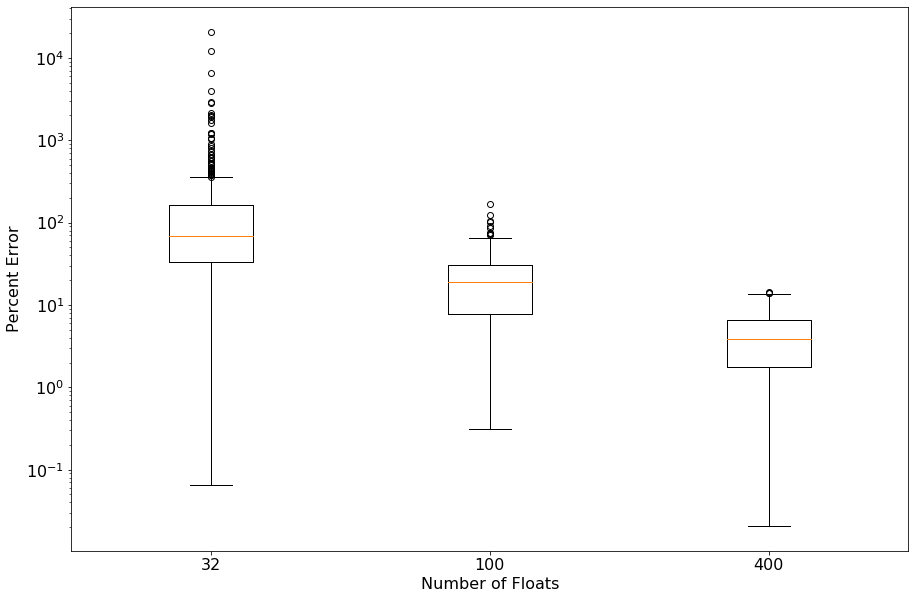

In [25]:
plt.figure()
plt.boxplot([np.abs(percentdif32)*100,np.abs(percentdif100)*100,np.abs(percentdif400)*100])
plt.yscale('log')
plt.xlabel('Number of Floats')
plt.ylabel('Percent Error')
plt.xticks([1,2,3],[32,100,400])
plt.savefig(plot_dir+'RandomError'+'.eps')

In [30]:
percentdif

array([3.98603485])

3.9860348546640725


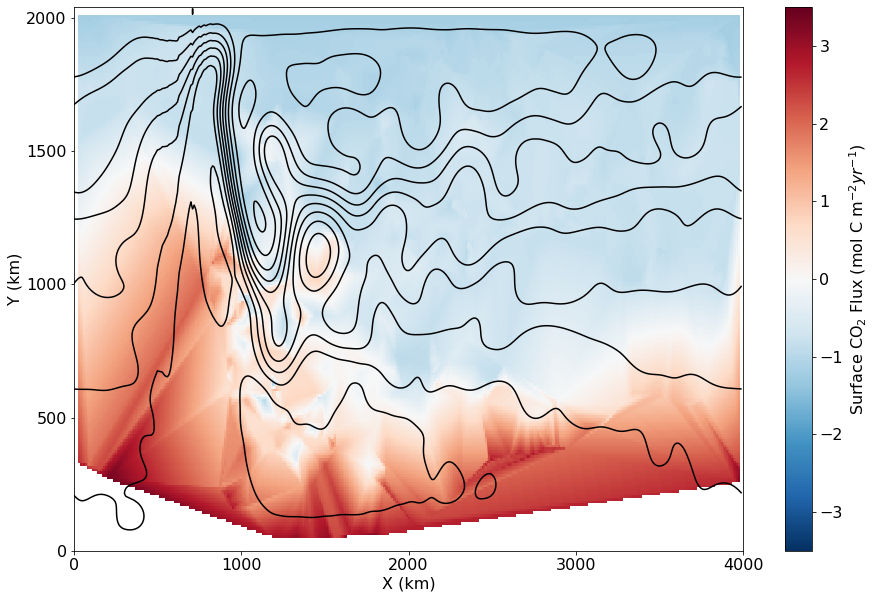

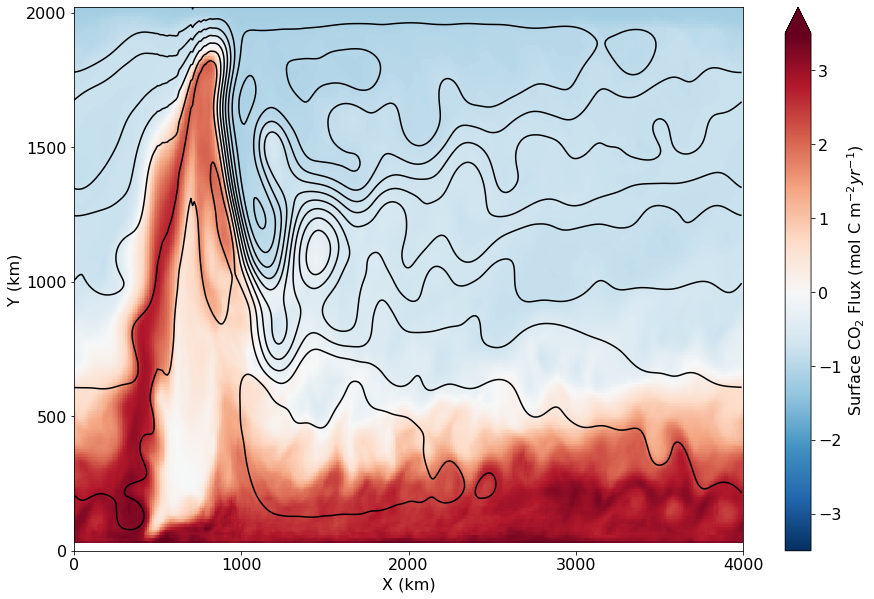

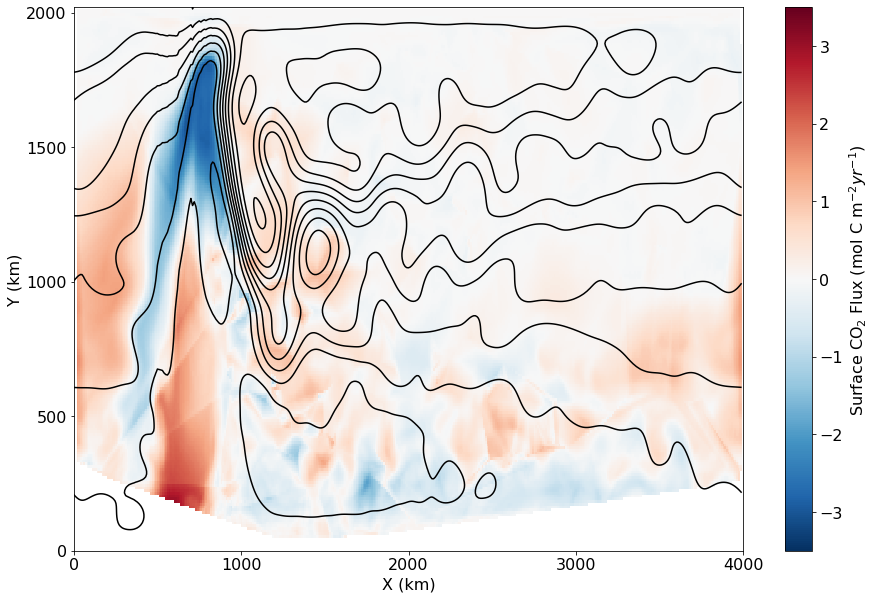

<Figure size 1080x720 with 0 Axes>

In [31]:
fig, ax = plt.subplots()
(-3600*24*360*ArgoGrid.DICFLX[:,3:-2]).plot(vmin = -3.5, vmax = 3.5, cmap=plt.cm.RdBu_r,cbar_kwargs={'label': 'Surface CO$_2$ Flux (mol C m$^{-2} yr^{-1}$)'})
((ds.UVEL[:,:-3].mean(dim='time')*ds.dyG*ds.drF[:-3]/1e6).sum(dim='Z').cumsum(dim='YC')).plot.contour(levels = 20,colors = 'black',linewidth=1,linestyles='solid')
plt.title('')
plt.yticks([0,500000,1000000,1500000,2000000],[0,500,1000,1500,2000])
plt.ylabel('Y (km)')
plt.xticks([0,1000000,2000000,3000000,4000000],[0,1000,2000,3000,4000])
plt.xlabel('X (km)')

plt.savefig(plot_dir+'ArgoCO2Flux'+'dop15'+'.eps')
#plt.colorbar()


fig, ax = plt.subplots()
(-3600*24*360*ds.DICCFLX[:,3:-2].mean(dim='time')).plot(vmin = -3.5, vmax = 3.5, cmap=plt.cm.RdBu_r,cbar_kwargs={'label': 'Surface CO$_2$ Flux (mol C m$^{-2} yr^{-1}$)'})
((ds.UVEL[:,:-3].mean(dim='time')*ds.dyG*ds.drF[:-3]/1e6).sum(dim='Z').cumsum(dim='YC')).plot.contour(levels = 20,colors = 'black',linewidth=1,linestyles='solid')
plt.title('')
plt.yticks([0,500000,1000000,1500000,2000000],[0,500,1000,1500,2000])
plt.ylabel('Y (km)')
plt.xticks([0,1000000,2000000,3000000,4000000],[0,1000,2000,3000,4000])
plt.xlabel('X (km)')

plt.savefig(plot_dir+'CO2Flux'+'dop15'+'.eps',bbox_inches='tight')

plt.figure()
(3600*24*360*(ds.DICCFLX[:,3:202].mean(dim='time')-ArgoGrid.DICFLX)).plot(vmin = -3.5, vmax = 3.5, cmap=plt.cm.RdBu_r,cbar_kwargs={'label': 'Surface CO$_2$ Flux (mol C m$^{-2} yr^{-1}$)'})
((ds.UVEL[:,:-3].mean(dim='time')*ds.dyG*ds.drF[:-3]/1e6).sum(dim='Z').cumsum(dim='YC')).plot.contour(levels = 20,colors = 'black',linewidth=1,linestyles='solid')
plt.title('')
plt.yticks([0,500000,1000000,1500000,2000000],[0,500,1000,1500,2000])
plt.ylabel('Y (km)')
plt.xticks([0,1000000,2000000,3000000,4000000],[0,1000,2000,3000,4000])
plt.xlabel('X (km)')

plt.savefig(plot_dir+'DiffCO2Flux'+'dop15'+'.eps',bbox_inches='tight')

plt.figure()
difcalc = (np.array(((3600*24*360*(ds.DICCFLX[:,2:202].mean(dim='time')-ArgoGrid.DICFLX))*ds.rA[2:202]).sum(dim='XC').sum(dim='YC')))
baseline = (np.array(((3600*24*360*(ds.DICCFLX[:,2:202].mean(dim='time')-0*ArgoGrid.DICFLX))*ds.rA[2:202]).sum(dim='XC').sum(dim='YC')))
percentdif = difcalc/baseline
print(percentdif)

In [5]:
lonvec = np.array(dst.lon[:,1:]).flatten()
lonvec  = lonvec[~np.isnan(lonvec)]

latvec = np.array(dst.lat[:,1:]).flatten()
latvec  = latvec[~np.isnan(latvec)]

horzvec = np.array(np.sqrt((dst.lat[:,1:]-dst.lat[:,:-1])**2 + (dst.lon[:,1:]-dst.lon[:,:-1])**2)) 
horzvec = horzvec[~np.isnan(horzvec)]

dispvec = np.array(dst.z[:,1:]-dst.z[:,0]).flatten()
dispvec = dispvec[~np.isnan(dispvec)]

tempvec = np.array(dst.t[:,1:]-dst.t[:,0]).flatten()
tempvec = tempvec[~np.isnan(tempvec)]
                   
dicvec = np.array(dst.dic[:,1:]).flatten()
dicvec = dicvec[~np.isnan(dicvec)]
                  
alkvec = np.array(dst.alk[:,1:]).flatten()
alkvec = alkvec[~np.isnan(alkvec)]

phvec = np.array(dst.ph[:,1:]).flatten()
phvec = phvec[~np.isnan(phvec)]

dicfluxvec = np.array(dst.dicflux[:,1:]).flatten()
dicfluxvec = dicfluxvec[~np.isnan(dicfluxvec)]


mask = xgrid*0 + 1
for i in range(400):
    #print(i)
    for j in range(204):
        if mindist(xgrid[j,i],ygrid[j,i],lonvec,latvec)>60000000:
            mask[j,i] = np.nan
            
dispgrid = interpolate.griddata((lonvec,latvec),dispvec,(xgrid,ygrid),method='linear')
tempgrid = interpolate.griddata((lonvec,latvec),tempvec,(xgrid,ygrid),method='linear')
dicgrid = interpolate.griddata((lonvec,latvec),dicvec,(xgrid,ygrid),method='linear')
alkgrid = interpolate.griddata((lonvec,latvec),alkvec,(xgrid,ygrid),method='linear')
phgrid = interpolate.griddata((lonvec,latvec),phvec,(xgrid,ygrid),method='linear')
dicfluxgrid = interpolate.griddata((lonvec,latvec),dicfluxvec,(xgrid,ygrid),method='linear')

ArgoGrid = xr.Dataset({"Disp":  
        (("YC","XC"),dispgrid),
        "Temp": (("YC","XC"), tempgrid),
        "DIC": (("YC","XC"), dicgrid),
        "ALK": (("YC","XC"), alkgrid),
        "DICFLX": (("YC","XC"), dicfluxgrid),
        "PH": (("YC","XC"), phgrid)},
    coords={"YC": ds.YC,"XC":ds.XC})

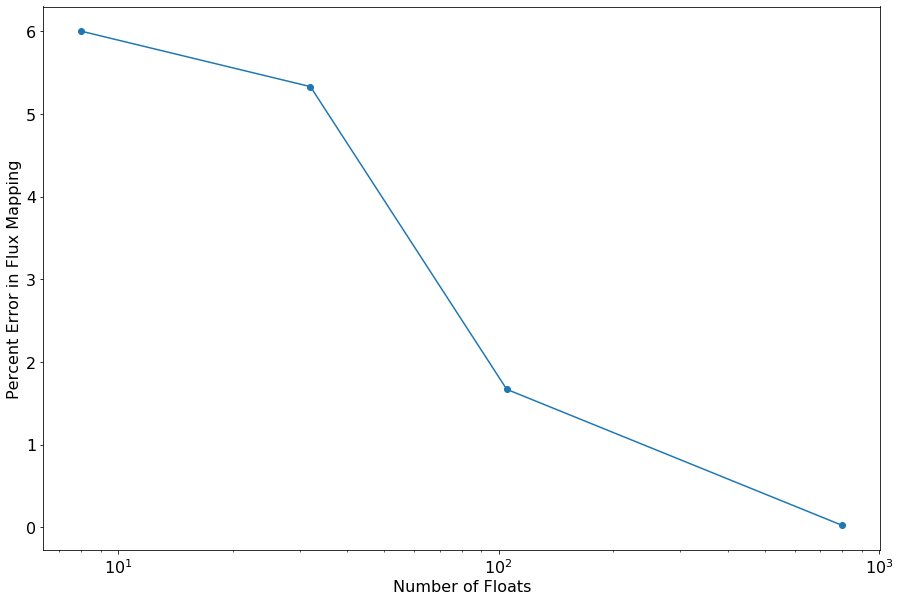

In [9]:
diff8 = 6
diff32 = 5.33
diff105 = 1.67
diff800 = 0.025

plt.figure()
plt.plot([8,32,105,800],[diff8,diff32,diff105,diff800],'o-')
plt.xlabel('Number of Floats')
plt.ylabel('Percent Error in Flux Mapping')
plt.xscale('log')

plt.savefig(plot_dir+'DiffCO2Flux'+'all'+'.eps',bbox_inches='tight')

#plt.figure()
#ArgoGrid.PH.plot()
#plt.colorbar()

#plt.title('pH')
#plt.title('DIC Flux Particles(mol/m2/sec)')
#plt.savefig(plot_dir+'Displacement354'+'.eps')

0.0005166434399278525


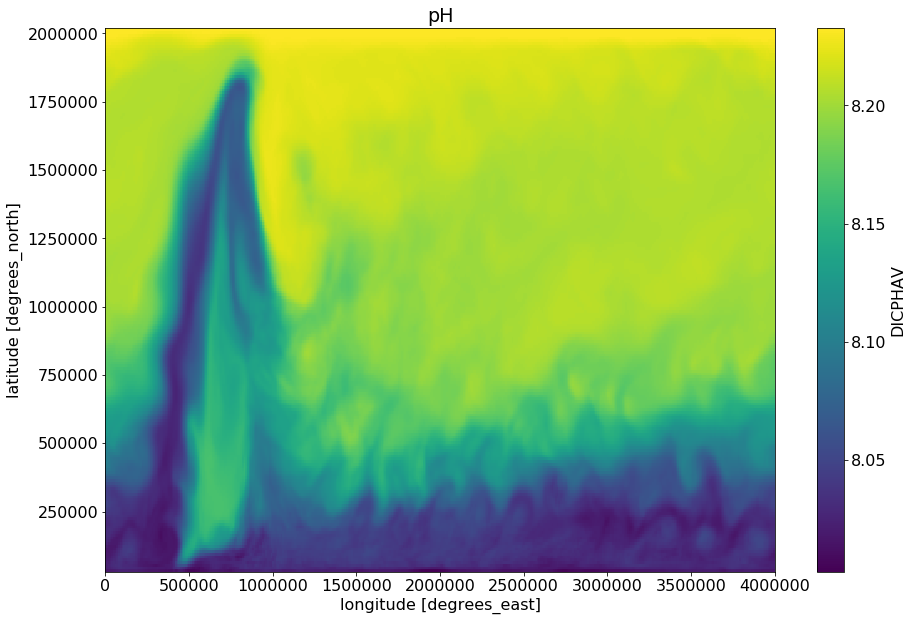

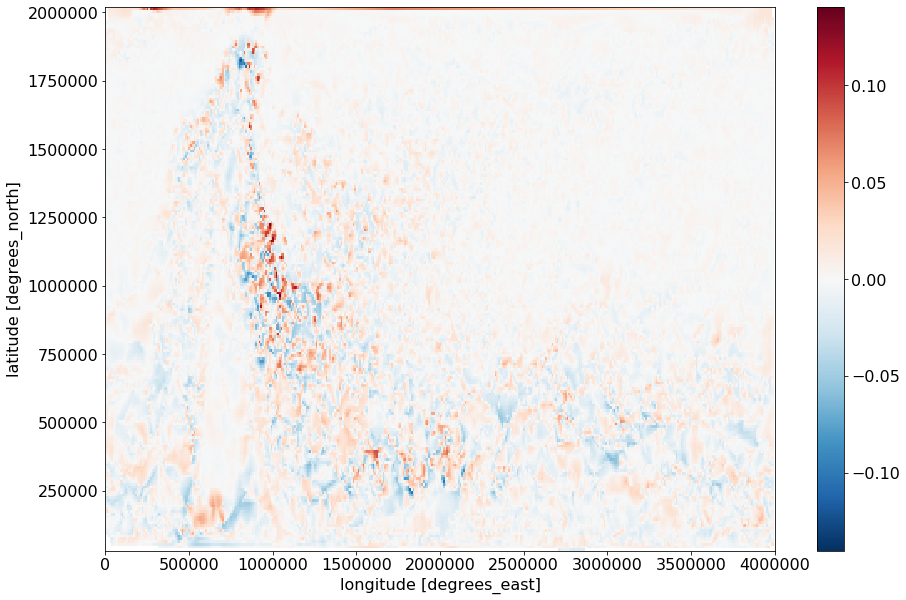

distributed.utils_perf - WARNING - full garbage collections took 16% CPU time recently (threshold: 10%)


In [19]:
#plt.figure()
#ds.DICPHAV[:,3:202].mean(dim='time').plot()
#plt.title('pH')

plt.figure()
(ds.DICCFLX[:,3:202].mean(dim='time')-ArgoGrid.DICFLX).plot()

print(np.array((ds.DICPHAV[:,4:202].mean(dim='time')-ArgoGrid.PH).mean(dim=['XC','YC'])))

3.077373652979013e-09


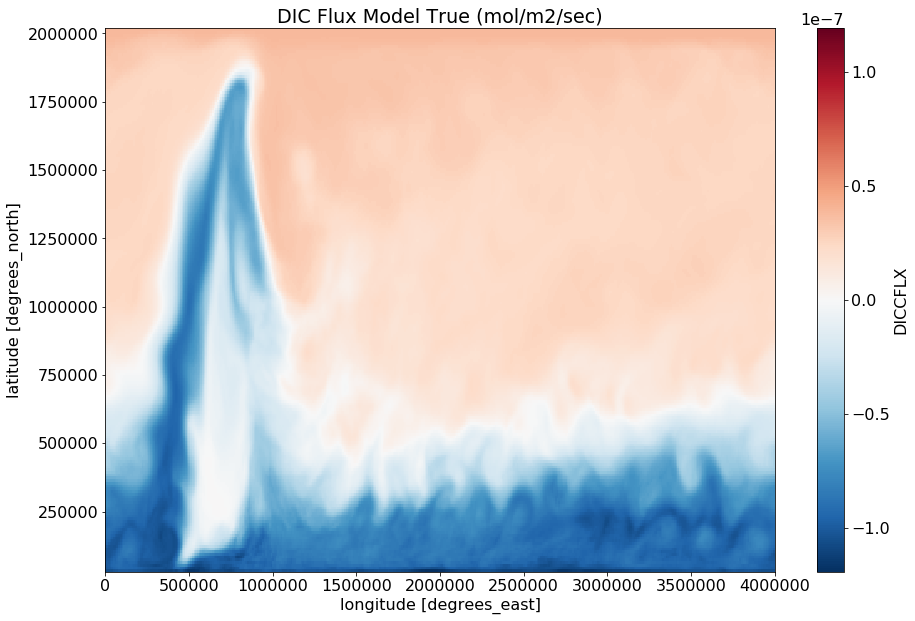

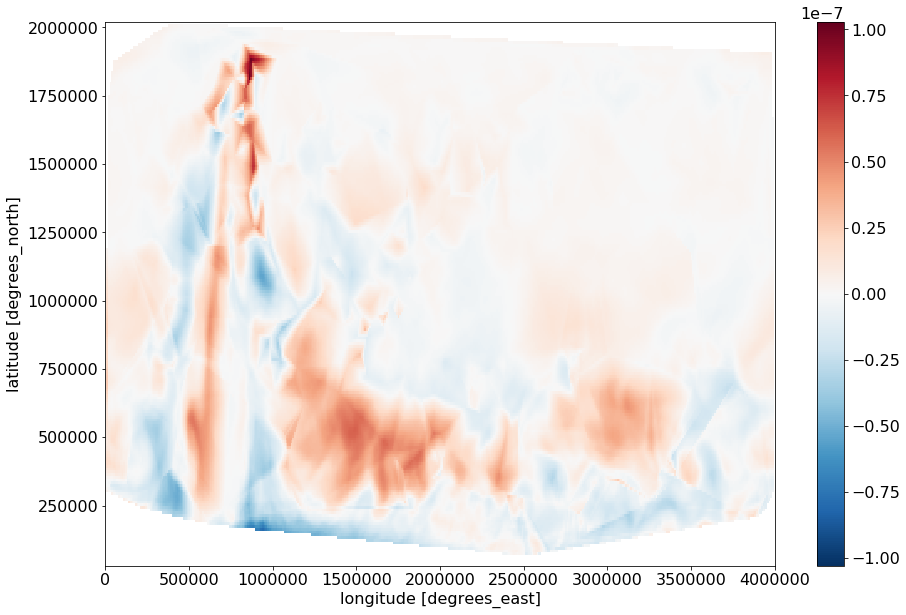

In [10]:
plt.figure()
ds.DICCFLX[:,3:202].mean(dim='time').plot()
plt.title('DIC Flux Model True (mol/m2/sec)')

plt.figure()
(ds.DICCFLX[:,3:202].mean(dim='time')-ArgoGrid.DICFLX).plot()

#print(np.array((ds.TRAC01[:,0,2:202].mean(dim='time')-ArgoGrid.DIC).mean(dim=['XC','YC'])))
print(np.array((ds.DICCFLX[:,4:202].mean(dim='time')-ArgoGrid.DICFLX).mean(dim=['XC','YC'])))

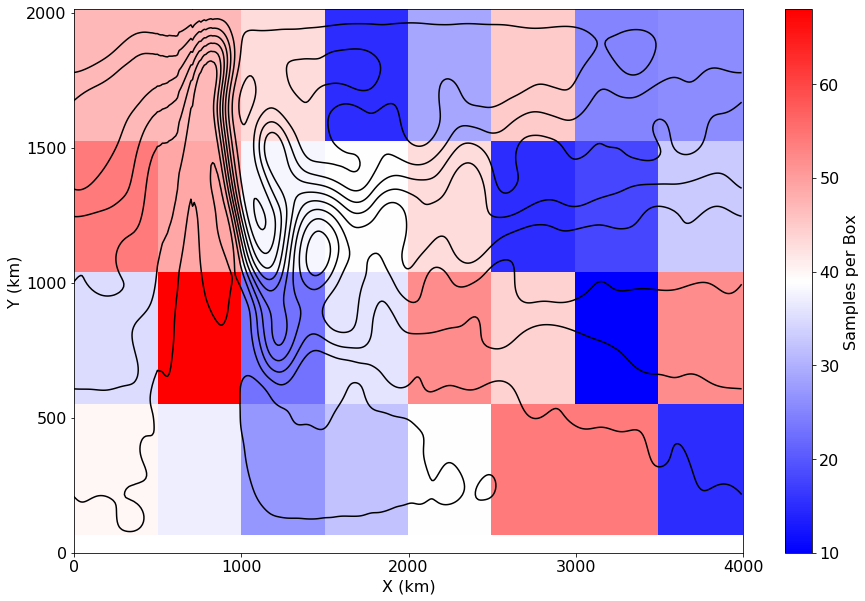

In [34]:
plt.figure()
plt.hist2d(lonvec,latvec,bins=(8,4),cmap='bwr')
plt.colorbar(label='Samples per Box')
((ds.UVEL[:,:-3].mean(dim='time')*ds.dyG*ds.drF[:-3]/1e6).sum(dim='Z').cumsum(dim='YC')).plot.contour(levels = 20,colors = 'black',linewidth=1,linestyles='solid')
plt.title('')
plt.yticks([0,500000,1000000,1500000,2000000],[0,500,1000,1500,2000])
plt.ylabel('Y (km)')
plt.xticks([0,1000000,2000000,3000000,4000000],[0,1000,2000,3000,4000])
plt.xlabel('X (km)')
plt.savefig(plot_dir+'Hist'+'.eps',bbox_inches='tight')

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


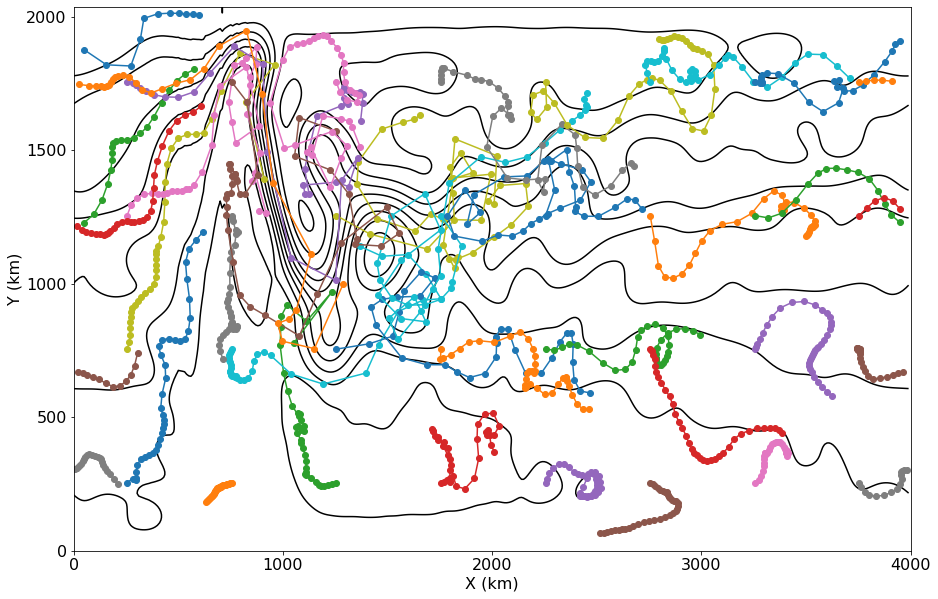

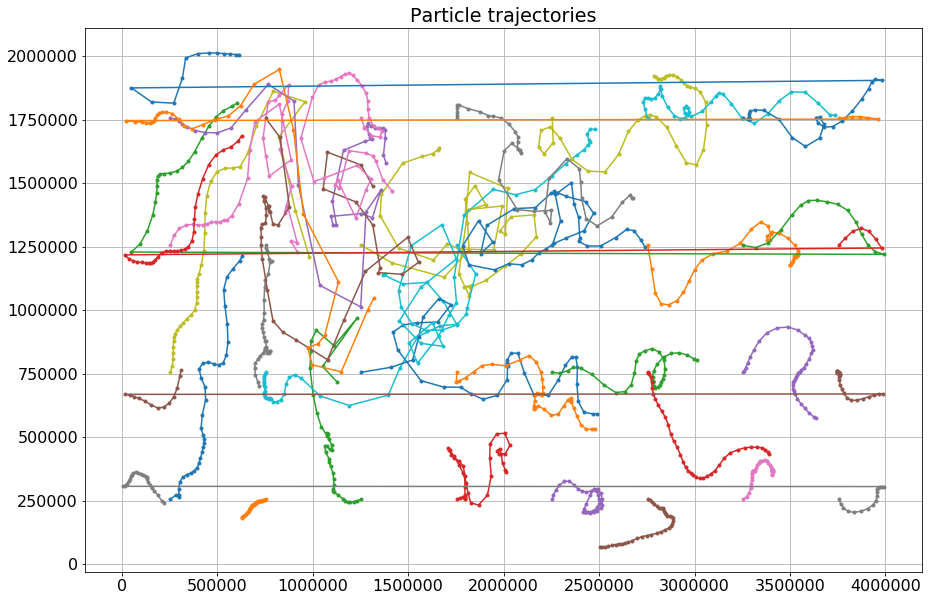

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


In [82]:
lons = dst.lon[:,0:-1].where((dst.lon[:,0:-1]-dst.lon[:,1:])<1e6)
lats = dst.lat[:,0:-1].where((dst.lon[:,0:-1]-dst.lon[:,1:])<1e6)
plt.figure()
plt.plot(lons.T,lats.T,'o-')
((ds.UVEL[:,:-3].mean(dim='time')*ds.dyG*ds.drF[:-3]/1e6).sum(dim='Z').cumsum(dim='YC')).plot.contour(levels = 20,colors = 'black',linewidth=1,linestyles='solid')
plt.title('')
plt.yticks([0,500000,1000000,1500000,2000000],[0,500,1000,1500,2000])
plt.ylabel('Y (km)')
plt.xticks([0,1000000,2000000,3000000,4000000],[0,1000,2000,3000,4000])
plt.xlabel('X (km)')
plt.xlim([0,4000000])
plt.savefig(plot_dir+'Traj'+'.eps',bbox_inches='tight')

#plotTrajectoriesFile('/glade/p/univ/umit0025/newcarbon/dop_15/ArgoCoarse.nc');

In [ ]:
plotTrajectoriesFile('/glade/p/univ/umit0025/newcarbon/dop_15/ArgoCoarse.nc',tracerfile='/glade/p/univ/umit0025/newcarbon/dop_15/testDICFlux.nc',
                     tracerfield='DICFLX',tracerlon='XC',tracerlat='YC',mode='2d')

#plotTrajectoriesFile('/glade/p/univ/umit0025/newcarbon/dop_15/ArgoCoarse.nc',tracerlat='YC',mode='movie2d_notebook')

<xarray.DataArray 'lon' (traj: 32, obs: 37)>
array([[ 255000.  ,  282536.47,  297978.44, ...,  550709.5 ,  583114.8 ,
         617653.75],
       [ 755000.  ,  751283.7 ,  747293.06, ...,  642030.75,  637306.44,
         632560.5 ],
       [1255000.  , 1233735.9 , 1215276.2 , ..., 1112513.1 , 1233017.1 ,
        1052293.1 ],
       ...,
       [2755000.  , 2740097.2 , 2732266.5 , ..., 3580610.2 , 3648879.5 ,
        3708793.5 ],
       [3255000.  , 3279115.5 , 3288182.  , ...,  537205.  ,  569125.7 ,
         598817.44],
       [3755000.  , 3787371.  , 3823092.2 , ...,  997242.7 , 1150066.2 ,
        1288301.8 ]], dtype=float32)
Dimensions without coordinates: traj, obs
Attributes:
    long_name:      
    standard_name:  longitude
    units:          degrees_east
    axis:           X


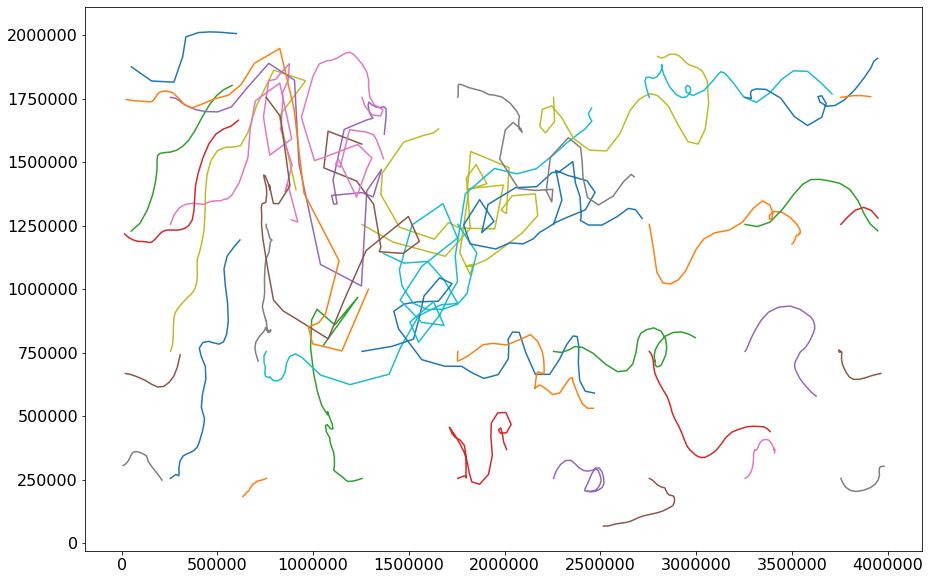

In [28]:

print(lons)

plt.plot(lons.T,lats.T)

In [21]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from datetime import timedelta as delta


timerange = np.arange(np.nanmin(dst['time'].values),
                      np.nanmax(dst['time'].values)+864000, 
                      864000)  # timerange in nanosecondt


In [29]:
%%capture
fig = plt.figure(figsize=(9,5),constrained_layout=True)
ax = fig.add_subplot()


ax.set_xlim(0, 4000000)
ax.set_ylim(0, 2000000)
plt.xticks(rotation=45)
plt.yticks([0,500000,1000000,1500000,2000000],[0,500,1000,1500,2000])
plt.xticks([0,1000000,2000000,3000000,4000000],[0,1000,2000,3000,4000])

time_id = np.where(dst['time'] == timerange[0]) # Indices of the data where time = 0
dicflux = (-3600*24*360*ds.DICCFLX[:,3:-2].mean(dim='time'))
dicflux.plot(vmin = -3.5, vmax = 3.5, cmap=plt.cm.RdBu_r,cbar_kwargs={'label': 'Surface CO$_2$ Flux (mol C m$^{-2} yr^{-1}$)'})
plt.plot(lons.T,lats.T,'k-',alpha=0.3)
scatter = ax.scatter(dst['lon'].values[time_id], dst['lat'].values[time_id],color='k')

t = str(timerange[0].astype('timedelta64[D]')/(24*3600))
title = ax.set_title('Particles at t = '+t)
ax.set_ylabel('Y (km)')
ax.set_xlabel('X (km)')

def animate(i):
    t = str(timerange[i].astype('timedelta64[D]')/(24*3600))
    title.set_text('Particles at t = '+t)
    
    time_id = np.where(dst['time'] == timerange[i])
    
    scatter.set_offsets(np.c_[dst['lon'].values[time_id], dst['lat'].values[time_id]])
    
anim = FuncAnimation(fig, animate, frames = len(timerange), interval=500)

In [30]:
HTML(anim.to_jshtml())

In [14]:
anim.save(plot_dir+'ParticleMovie.mp4')

Text(0.5, 0, 'X (m)')

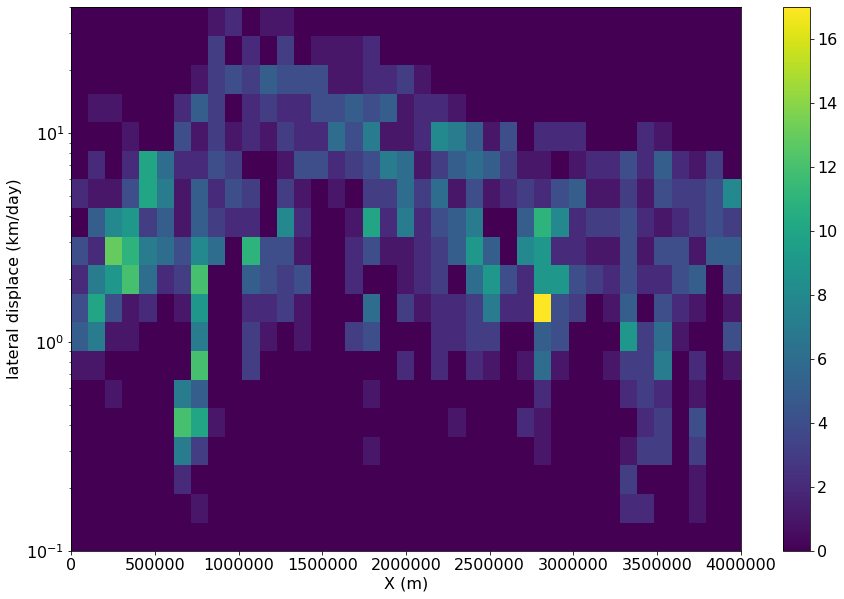

In [80]:
newhorz = horzvec[horzvec<3500000]
newlon = lonvec[horzvec<3500000]

logbins = np.logspace(-1,np.log10(40),20)
lonbins = np.linspace(0,4000000,40)
plt.figure()
plt.hist2d(newlon,newhorz/10000,[lonbins,logbins])
plt.colorbar()
plt.yscale('log')
plt.ylabel('lateral displace (km/day)')
plt.xlabel('X (m)')

AttributeError: 'numpy.ndarray' object has no attribute 'where'

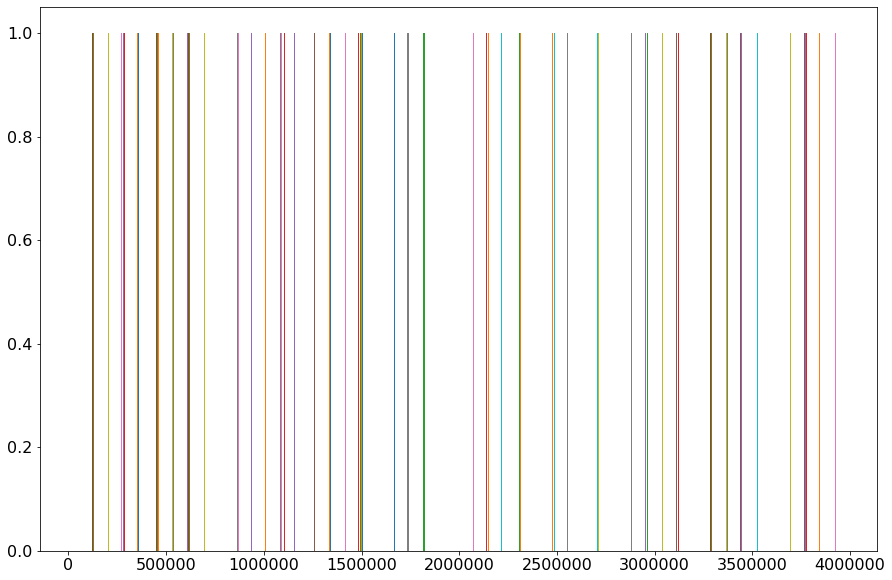

<Figure size 1080x720 with 0 Axes>

In [59]:
fig,ax = plt.subplots(1,1,figsize = (9,5))
logbins = np.logspace(-1,np.log10(40),20)
lonbins = np.linspace(0,4000000,50000)
hist, xedges, yedges = np.histogram2d(newlon.T,displacements.T/10,bins = [lonbins,logbins])
hist = hist.T
with np.errstate(divide='ignore', invalid='ignore'):  # suppress division by zero warnings
    hist = hist / hist.sum(axis=0, keepdims=True)
hist[hist == 0] = np.nan
h = ax.pcolormesh(xedges, yedges, hist, cmap='PuBu')

In [53]:
displacements.shape

(1, 1184)